#     Prediction on hospital readmission for Diabetic patients

## Healthcare Application/Real World Problem

### 1.1 About Diabetes 

Diabetes is a disease that occurs when your blood glucose, also called blood sugar, is too high. Blood glucose is your main source of energy and comes from the food you eat. Insulin, a hormone made by the pancreas, helps glucose from food get into your cells to be used for energy. Sometimes your body doesn’t make enough—or any—insulin or doesn’t use insulin well. Glucose then stays in your blood and doesn’t reach your cells.

### 1.2 Problem Statement 

We are given a dataset which consists of patients having diabetes from which we have to predict if they will be readmitted in the hospital within a month

### 1.3 Source 
The data are submitted on behalf of the Center for Clinical and Translational Research, Virginia Commonwealth University, a recipient of NIH CTSA grant UL1 TR00058 and a recipient of the CERNER data. John Clore (jclore '@' vcu.edu), Krzysztof J. Cios (kcios '@' vcu.edu), Jon DeShazo (jpdeshazo '@' vcu.edu), and Beata Strack (strackb '@' vcu.edu). This data is a de-identified abstract of the Health Facts database (Cerner Corporation, Kansas City, MO).

Original source of the data set
https://archive.ics.uci.edu/ml/datasets/Diabetes+130-US+hospitals+for+years+1999-2008

### 1.4. Real-world/Business objectives and constraints.
there are no specific constraints but since its a problem which deals with health of people and money saving we will try to increase accuracy as much as possible

### 2. Machine Learning Problem

1.The data are submitted on behalf of the Center for Clinical and Translational Research, Virginia Commonwealth University, a recipient of NIH CTSA grant UL1 TR00058 and a recipient of the CERNER data
2.There are two files one regarding the dataset which consists of total features
3.One regarding the pdf about dataset
4.it consists of 50 features


### 2.2. Type of Machine Learning Problem
it is a classification problem if true means the patient will be readmitted to hospital
if false he wont be 

## 3. Exploratory Data Analysis

In [1]:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc
import pandas as pd
import matplotlib.pyplot as plt
import time
import warnings
import numpy as np
from sklearn.ensemble import RandomForestClassifier
warnings.filterwarnings("ignore")
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from scipy import stats
from sklearn.feature_extraction.text import CountVectorizer

In [5]:
# reading the data using pandas
data=pd.read_csv('diabetic_data.csv')
print("Number of data points:",data.shape[0])

Number of data points: 101766


In [6]:
# printing transpose of first rows
print(data.head().T)

                                                 0          1  \
encounter_id                               2278392     149190   
patient_nbr                                8222157   55629189   
race                                     Caucasian  Caucasian   
gender                                      Female     Female   
age                                         [0-10)    [10-20)   
weight                                           ?          ?   
admission_type_id                                6          1   
discharge_disposition_id                        25          1   
admission_source_id                              1          7   
time_in_hospital                                 1          3   
payer_code                                       ?          ?   
medical_specialty         Pediatrics-Endocrinology          ?   
num_lab_procedures                              41         59   
num_procedures                                   0          0   
num_medications          

In [7]:
data.describe()

,encounter_id,patient_nbr,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
count,1.017660e+05,1.017660e+05,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.652016e+08,5.433040e+07,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607
std,1.026403e+08,3.869636e+07,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600
min,1.252200e+04,1.350000e+02,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
25%,8.496119e+07,2.341322e+07,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000
50%,1.523890e+08,4.550514e+07,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000
75%,2.302709e+08,8.754595e+07,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000
max,4.438672e+08,1.895026e+08,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000


In [8]:
print("number of columns in our dataset",len(data.columns),sep="\n")
# name of columns in our dataset
print(data.columns)

number of columns in our dataset
50
Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')


In [9]:
#information about dataset 
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

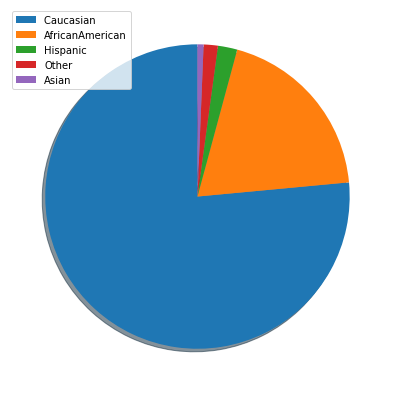

In [10]:
# plot of the race or demographics
# Import libraries 
from matplotlib import pyplot as plt 
import numpy as np  
races = ['Caucasian ', 'AfricanAmerican', 'Hispanic', 
        'Other', 'Asian'] 
  
ep = [76099, 19210,2037, 1506, 641] 
  
# Creating plot 
fig = plt.figure(figsize =(10, 7)) 
patches, texts = plt.pie(ep, shadow=True, startangle=90)
plt.legend(patches, races)
  
# show plot 
plt.show() 

it is evident from the data that caucasian are more because most people are caucasians in america

In [11]:
# here the missing values were represented by using ? so we will check for the number of missing data
#https://stackoverflow.com/questions/35277075/python-pandas-counting-the-occurrences-of-a-specific-value
t=data.isin(['?']).sum(axis=0)
print((t))
t=dict(t)

encounter_id                    0
patient_nbr                     0
race                         2273
gender                          0
age                             0
weight                      98569
admission_type_id               0
discharge_disposition_id        0
admission_source_id             0
time_in_hospital                0
payer_code                  40256
medical_specialty           49949
num_lab_procedures              0
num_procedures                  0
num_medications                 0
number_outpatient               0
number_emergency                0
number_inpatient                0
diag_1                         21
diag_2                        358
diag_3                       1423
number_diagnoses                0
max_glu_serum                   0
A1Cresult                       0
metformin                       0
repaglinide                     0
nateglinide                     0
chlorpropamide                  0
glimepiride                     0
acetohexamide 

 here the missing values were represented by using ? so we will check for the number of missing data
#https://stackoverflow.com/questions/35277075/python-pandas-counting-the-occurrences-of-a-specific-value

[2273, 98569, 40256, 49949, 21, 358, 1423]
['race', 'weight', 'payer_code', 'medical_specialty', 'diag_1', 'diag_2', 'diag_3']


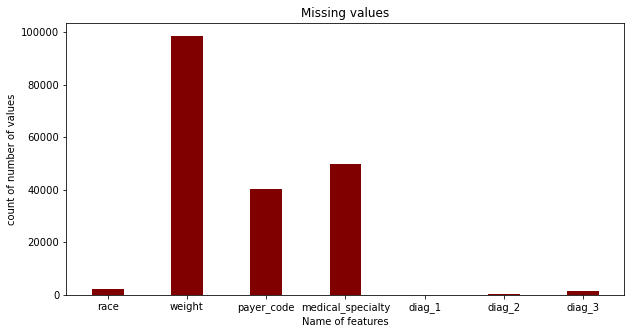

In [12]:
missing=[]
labels=[]
for i,j in t.items():
    if(j!=0):
        missing.append(j)
        labels.append(i)
print(missing)
print(labels)
fig = plt.figure(figsize = (10, 5)) 
plt.bar(labels, missing, color ='maroon',  
        width = 0.4) 
plt.xlabel("Name of features") 
plt.ylabel("count of number of values") 
plt.title("Missing values") 
plt.show()

 by looking at the above data we can see that weight payer code medical speciality features are showing more missing data so here for them the percent of missing data is more than 50% normal threshold will be 25-30% but this three columns should be removed from the dataset 

In [13]:
print('percentage of missing data in the columns')
for i,j in t.items():
    if(j!=0):
        print(i,(j/(data.shape[0])))


percentage of missing data in the columns
race 0.022335554114340742
weight 0.9685847925633315
payer_code 0.395574160328597
medical_specialty 0.49082208203132677
diag_1 0.0002063557573256294
diag_2 0.0035178743391702533
diag_3 0.013983059174970029


In [14]:
# here we are copying categorical features from dataset
data_cat = data.select_dtypes(include = 'object').copy()
data_cat.head(2)

,race,gender,age,weight,payer_code,medical_specialty,diag_1,diag_2,diag_3,max_glu_serum,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),?,?,Pediatrics-Endocrinology,250.83,?,?,None,...,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),?,?,?,276,250.01,255,None,...,No,Up,No,No,No,No,No,Ch,Yes,>30


In [15]:
# we are dropping the medications column from our categorical data
data_cat=data_cat.drop(['metformin',
       'repaglinide', 'nateglinide', 'chlorpropamide', 'glimepiride',
       'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone'],axis=1)

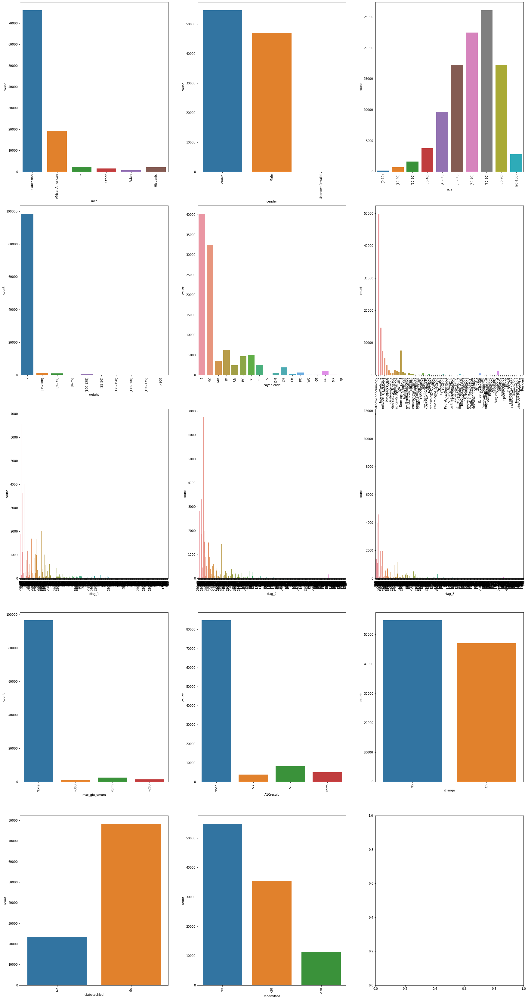

In [16]:
#https://towardsdatascience.com/how-to-perform-exploratory-data-analysis-with-seaborn-97e3413e841d
fig, ax = plt.subplots(5, 3,figsize=(30, 60))
for variable, subplot in zip(data_cat, ax.flatten()):
    sns.countplot(data[variable], ax=subplot)
    for label in subplot.get_xticklabels():
        label.set_rotation(90)

1.here coming to categorical columns for race here the caucasian are more when compared to any other race <br>
2.when it comes to gender most of the people who are admitted for diabetes are from female <br>
3.when it comes to age most of the cases come from people lying in the age gap of 60-90 <br>
4.in weight the most of the values are ? which is missing values so it wont be helpful in determinig the answer <br>
5.here when it comes to the medical id the most of the cases of admission are from the mc which is medical care <br>
6.when it comes to the medical speciality the people who are having the pediactric endocrinology is more <br>
when it comes to diag_1,diag_2,diag_3 there are so many classes making it hard to tell but most of the cases are fro icd codes belonging to 250
<br>
7.in max_glu_serum the none are more which is a drawback because the relation with max_glu_serum and readmission is more<br>
8.the a1c is having none values which is a drawback same like max_glu_serum<br>
change will tell if there is any change in the given medication irrespective of the type of medication with most of them being no<br>
9.here for the diabetes med will tell if there is a prescribed diabetes med with yes or no with most showing that there is a prescription of diabetes med<br>
10.her for the readmitted feature which is the output label showing no and >30,<30 here no means there is no case of hospital readmission and >30 means there is a readmission after thrity day<br>
and <30 means there is hospital readmission <br>




In [17]:
# here we are storing the numerical features of data for creating histograms
c = data.select_dtypes(include = 'object').copy()
x=list(c.columns)
data_num = data.drop(x,axis=1)

In [18]:
print(data_num.columns)

Index(['encounter_id', 'patient_nbr', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient',
       'number_diagnoses'],
      dtype='object')


# univariate analysis

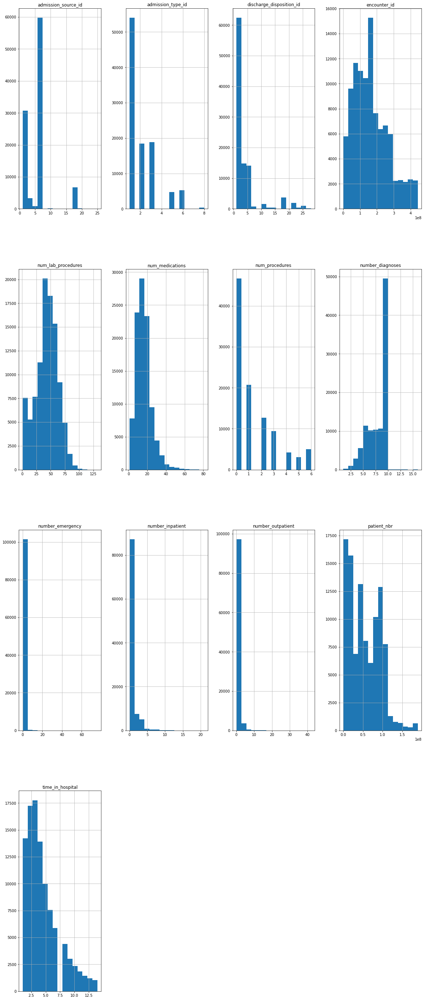

In [19]:
data_num.hist(bins=15, figsize=(20, 50));

histogram for the numerical features shows us that the people who are admitted with the admission source id 8 are most and with 1 are more <br>
and for the admission type id the cases with 0 and 3 are more <br>
and for the dischare disposition id with 0 are more and with 25 are least <br>
for num_diagnosis most no of people who are admitted having atleast 10 diagnoses <br>
here time in hospital is in between 0 and 14 days at max <br>
there are less no of emergency cases which are 0 <br>




In [20]:
# here we are using pandas_profiling for univariate analysis
import pandas_profiling
pandas_profiling.ProfileReport(data)

1.Here i did pandas profiling and first look at the overview here whle looking at variables<br>
2.here the encounter id is having all distinct values and these encounter id doesnt give any importance<br>
3.in patient_nbr we can see that these tell us about the records of patient and 70% of them are unique so there are <br>
4.multiple records of a single patient which are to be removed as they may give bias towards a particular patient<br>
5.here the gender has 0% missing values and 3 invalid values which can be removed and most of the cases are of females means more number of females are there<br>
6.here age is a categorical feature which we normally expect to be numerical but we have to modify the age from categorical to numerical <br>
7.in weight cateogry the ? category is more which means missing and these column cannot be used <br>
8.in admission_type id has 8 categories and most ids fall under cateogry is 0 <br>
9.discharged disposition id has highest no of categories belonging to 1 with 59% of frequecy <br>
10.time in hospital is noted in terms of days upto 14 days<br>
11.payer_code also has majority of features with ? means high number of missing values  with 39% missing values<br>
12.here medical speciality has 49% missing values <br>
13.here num_emergency has most number of zeros so there are less of emergency cases <br>
14.here diag_1 has high cardinality which is ic9 codes for different diseases same goes with diag_2 and diag_3<br>
15.here max_glu_serum and a1c result are very important in determing the hospitsal readmission but most of them are none which is a drawback<br>
16.acetohexamide,troglitazone,examide,citoglipton,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone<br>

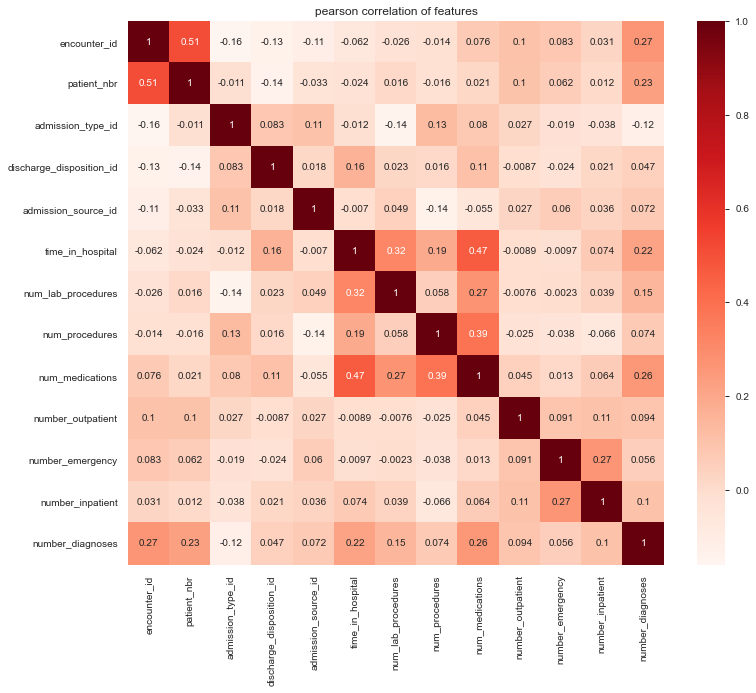

In [21]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.title("pearson correlation of features")
plt.show()


In [22]:
# by looking at the heatmap there is less relation of correlated features


 here the output variable is categorical so we will perform the data cleaning here are there is so much data cleaning needs to be done and there should be further cleaning and eda should be done

# DATA CLEANING 

In [ ]:
# here by looking at the features the weight,payer code and medical speciality  haing more more number 
#of missing values so drop them
data=data.drop(['weight','payer_code','medical_specialty'],axis=1)

In [28]:
print(data['gender'].unique())
# here gender has 3 unique values

['Female' 'Male']


In [29]:
data['gender'].isin(['Unknown/Invalid']).sum(axis=0)

0

here gender must be missing so it has only 3 unknown values so drop the rows no need for imputation as there are only 3 rows


In [30]:
data=data[data['gender']!='Unknown/Invalid']

In [31]:
data.drop((data[(data['diag_1'] == '?') & (data['diag_2'] == '?') & (data['diag_3'] == '?')]).index,inplace=True)

here the diagnosis is classified as below on icd9 codes so group them

![title](3.png)

In [26]:
# here for the discharge disposition id
#the 11,19,20,21 are expired they wont return or get readmitted so drop them
for i in [11,19,20,21]:
    data=data[data['discharge_disposition_id']!=i]

#here there is new column which is for the change in medications only for insulin<br>
 and according to the study it was found that change in medication has shown good result in determing the hospital readmission rate<br>

In [32]:

data['change'] = data['change'].apply(lambda x: 0 if (x == 'No' or x == 'Ch') else 1)

here data['change'] is chaged from categorical to numerical
<br>here if the change is made represent it with 1 else 0 

here a1c result is modified such that if a1c>7 or 8 replace with 1 means they have diabetes else 0 <br>
<br>
here none is also present which is invalid and replaced with -1

In [33]:
data['A1Cresult'].value_counts()

None    84744
>8       8216
Norm     4990
>7       3812
Name: A1Cresult, dtype: int64

In [34]:
import tqdm as t
for index, row in t.tqdm(data.iterrows()):
    if(row['A1Cresult']=='Norm'):
        data.loc[index, 'A1Cresult'] = 0
    elif(row['A1Cresult']=='>7' or row['A1Cresult']=='>8'):
        data.loc[index, 'A1Cresult'] = 1
    else:
        data.loc[index, 'A1Cresult'] = -1
    
    

101762it [06:12, 273.23it/s]


here the readmitted='NO' then there is no readmission and if >30 then no readmission within a month  0 <br>
else if <30 then replace with 1

In [35]:
import tqdm as t
for index, row in t.tqdm(data.iterrows()):
    if(row['readmitted']=='NO' or row['readmitted']=='>30'):
        data.loc[index, 'readmitted'] = 0
    elif(row['readmitted']=='<30'):
        data.loc[index, 'readmitted'] = 1
    

101762it [06:22, 265.80it/s]


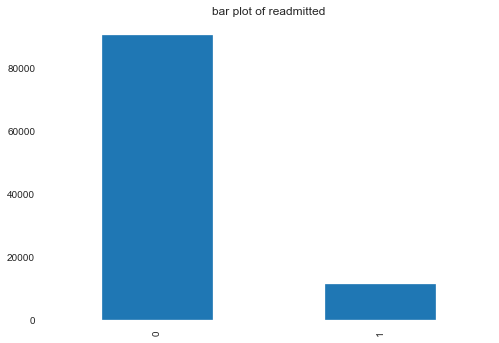

In [43]:
data['readmitted'].value_counts().plot(kind='bar')
plt.title("bar plot of readmitted")
plt.show()

 by looking  at the y class labels here there proportion here it is imbalanced dataset

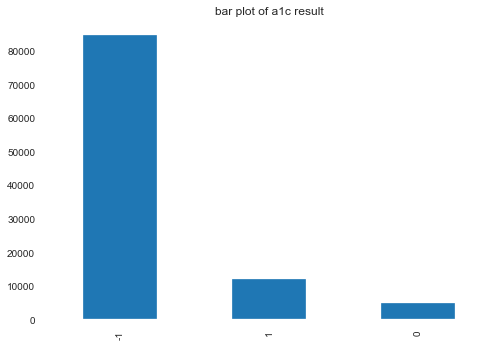

In [44]:

data['A1Cresult'].value_counts().plot(kind='bar');
plt.title("bar plot of a1c result")
plt.show()

 lets loook at the a1c class labels here there proportion here it is imbalanced dataset so <br>
 here the a1c is very important to find out the readmission but we have a drawback here that in the data it is none most times


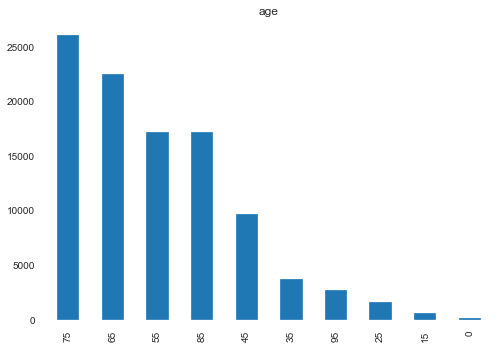

In [52]:

data['age'].value_counts().plot(kind='bar');
plt.title("age")
plt.show()

 here the major obeservation is the people with records are more with age>60 are in the records

 here the ? means 97% of data is missing in the weight so drop the column

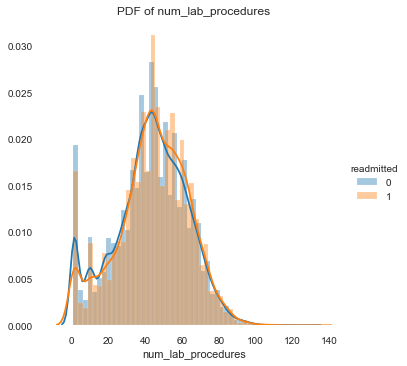

In [46]:
sns.FacetGrid(data, hue="readmitted", height=5) \
 .map(sns.distplot, "num_lab_procedures") \
 .add_legend();
plt.title("PDF of num_lab_procedures")
plt.show();

 by looking at the pdf of the num of lab procedures and readmitted  <br>
if the number of the lab procedures are less th no of readmission are least <br>
 so they have a negative trend<br>

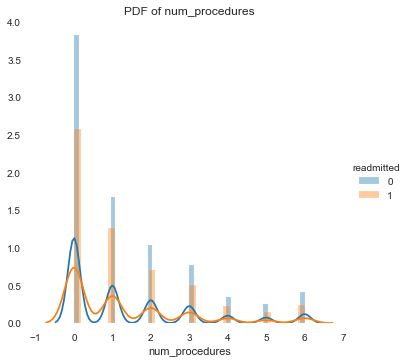

In [47]:
sns.FacetGrid(data, hue="readmitted", height=5) \
 .map(sns.distplot, "num_procedures") \
 .add_legend();
plt.title("PDF of num_procedures")
plt.show();

 the pdf of the number procedures to readmission rate shows that there is no trend in relation between them

In [50]:
dictmap = {'[0-10)':0, '[10-20)':15, '[20-30)':25, '[30-40)':35, '[40-50)':45, '[50-60)':55,'[60-70)':65, '[70-80)':75,  '[80-90)':85, '[90-100)':95}
data['age'] = data.age.replace(dictmap)

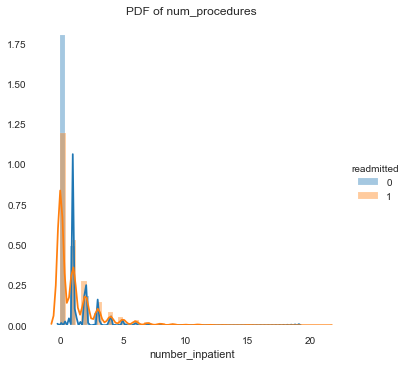

In [48]:
sns.FacetGrid(data, hue="readmitted", height=5) \
 .map(sns.distplot, 'number_inpatient') \
 .add_legend();
plt.title("PDF of num_procedures")
plt.show();
#here if the number of inpatients are more then there is more chance of getting readmitted

here for inpatient numbers most of them are 0 and here we can see that if no of inpatient is greater than 5 then there is high chance of readmission

 we can see that num of change in medications if it is less then readmission is more otherwise less
are readmitted more

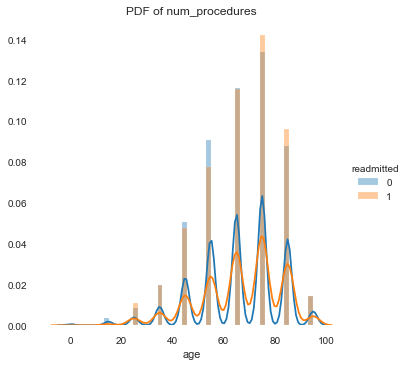

In [51]:
sns.FacetGrid(data, hue="readmitted", height=5) \
 .map(sns.distplot, "age") \
 .add_legend();
plt.title("PDF of num_procedures")
plt.show();
#by looking at the pdf the age between 60 and 90 having more chance of readmission or greater than 60 and for 0 age 
 # which is normally new babies have less chance of readmission

# box plot

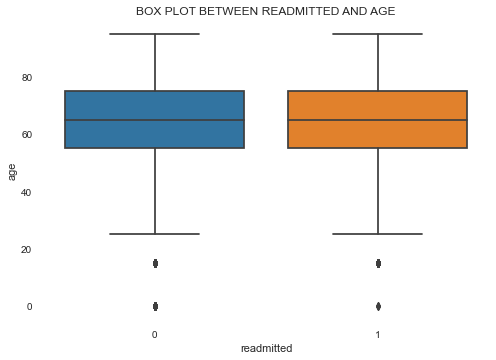

In [53]:
sns.boxplot(x='readmitted',y='age',data=data)
plt.title("BOX PLOT BETWEEN READMITTED AND AGE")
plt.show()

In [54]:
# here for the box plot for age vs readmitted doesnt give any details they are overlapped

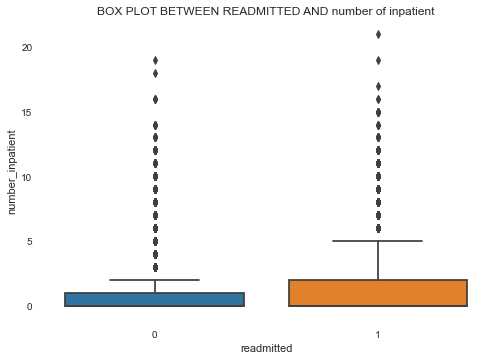

In [55]:
sns.boxplot(x='readmitted',y='number_inpatient',data=data)
plt.title("BOX PLOT BETWEEN READMITTED AND number of inpatient")
plt.show()
# for box plot if the number of inpatient are more than 1 and less than 2 there is a high chance of readmission

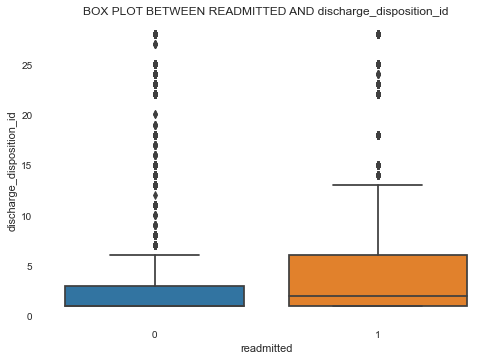

In [56]:
sns.boxplot(x='readmitted',y='discharge_disposition_id',data=data)
plt.title("BOX PLOT BETWEEN READMITTED AND discharge_disposition_id")
plt.show()
# for box plot if the dishcarge disposition id belong to 0 there is high chance of readmission

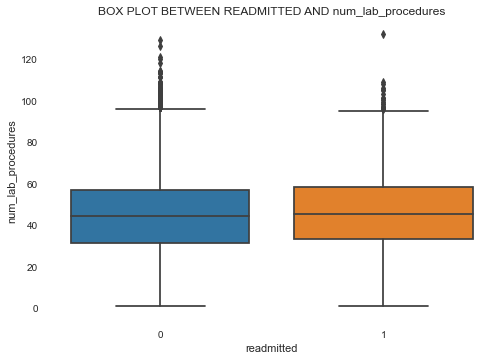

In [57]:
sns.boxplot(x='readmitted',y='num_lab_procedures',data=data)
plt.title("BOX PLOT BETWEEN READMITTED AND num_lab_procedures")
plt.show()
# for box plot if the num of lab procedures are between 35 and 55 there is high chance of readmission

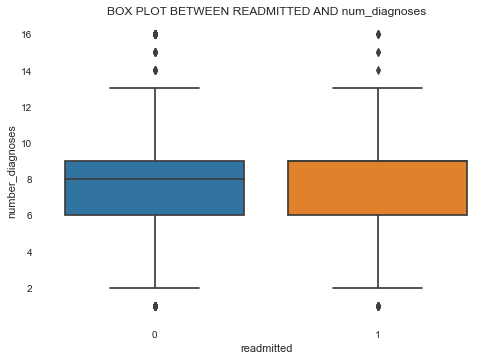

In [58]:
sns.boxplot(x='readmitted',y='number_diagnoses',data=data)
plt.title("BOX PLOT BETWEEN READMITTED AND num_diagnoses")
plt.show()
# for box plot if the num of diagnoses are between 8 and 9 there are high chances of readmission